In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import HDBSCAN
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from umap import UMAP

import models
from data_frame import DataFrame, MaxFiller, MAGNITUDES, COLORS
from histogram_plotter import HistPlotter
from utils import load_config, load_model

DATAPATH = "../dataframes/experiment3/MG_3_components_3.csv"

df = pd.read_csv(DATAPATH, index_col=0)
df, indices = df.loc[(df["split"] == "test")], df.index
columns_100 = df.columns[-100:]

2025-10-13 08:21:15.727267: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-13 08:21:15.741789: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


<b>Wykresy korelacji</b>

In [20]:
# sns.pairplot(df.sample(2000), x_vars=["Z_pred_std"], y_vars=COLORS + MAGNITUDES, kind="scatter", height=3.5, plot_kws=dict(s=15, alpha=0.1))

<b>Redukcja wymiarów - T-sne</b>

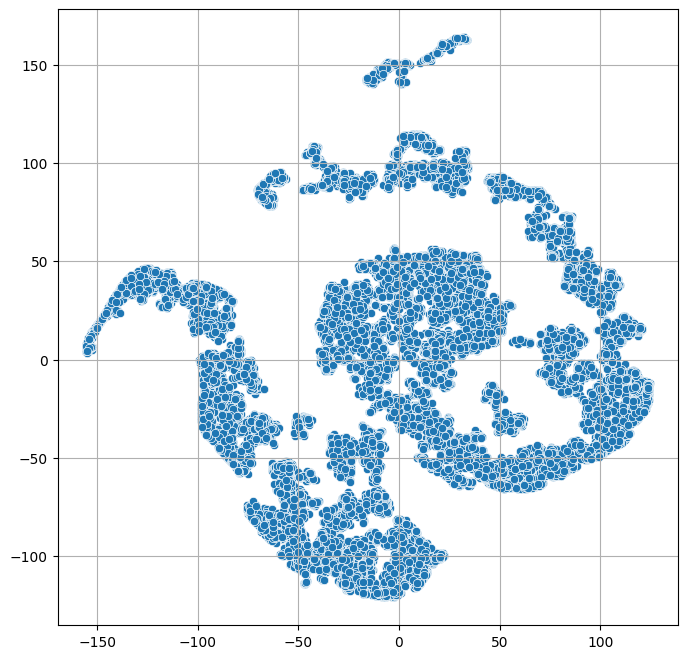

In [3]:
X_scaled = StandardScaler().fit_transform(df[columns_100])
X_emb = TSNE(n_components=2, perplexity=50, learning_rate=200, max_iter=8000,
             init="random", metric="correlation", random_state=0, n_jobs=-1).fit_transform(X_scaled)

plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1])
plt.grid()
plt.show()

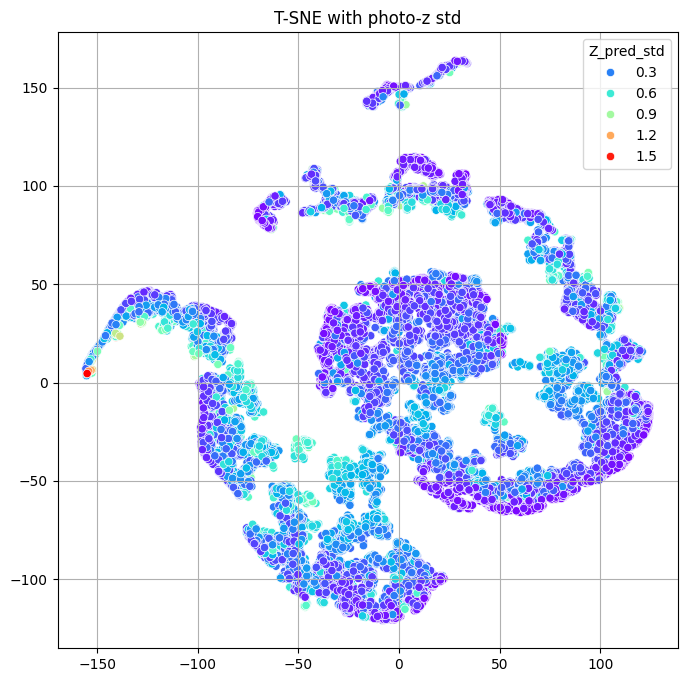

In [4]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["Z_pred_std"], palette="rainbow")
plt.grid()
plt.title("T-SNE with photo-z std")
plt.show()

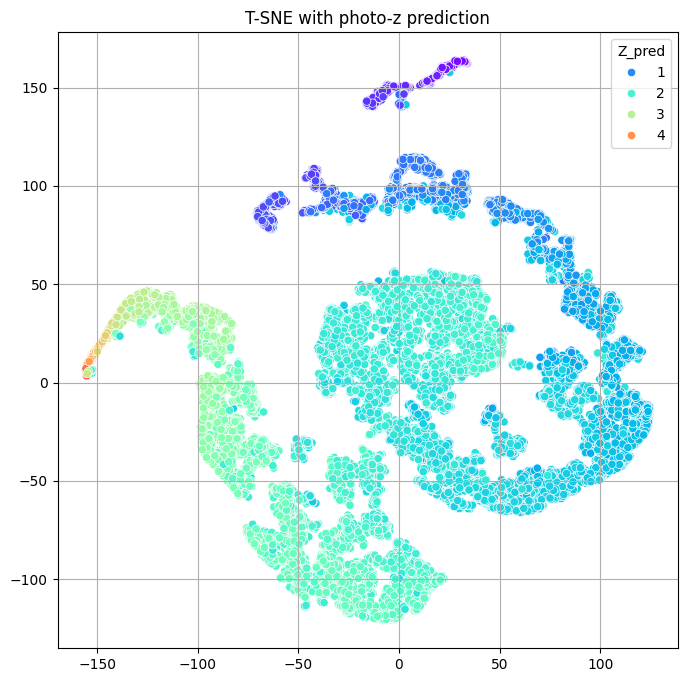

In [5]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["Z_pred"], palette="rainbow")
plt.grid()
plt.title("T-SNE with photo-z prediction")
plt.show()

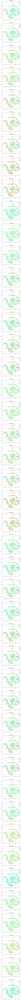

In [6]:
fig, axes = plt.subplots(45, 1, figsize=(7,360))
for ax, color in zip(axes, COLORS):
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df[color], palette="rainbow", ax=ax)
    ax.grid(True)
    ax.set_title(f"T-SNE with {color}")
plt.show()

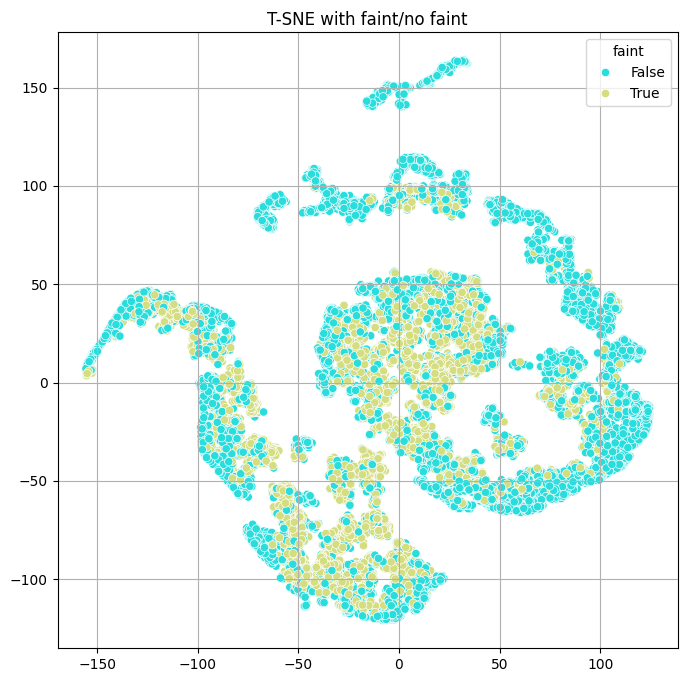

In [7]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["faint"], palette="rainbow")
plt.grid()
plt.title("T-SNE with faint/no faint")
plt.show()

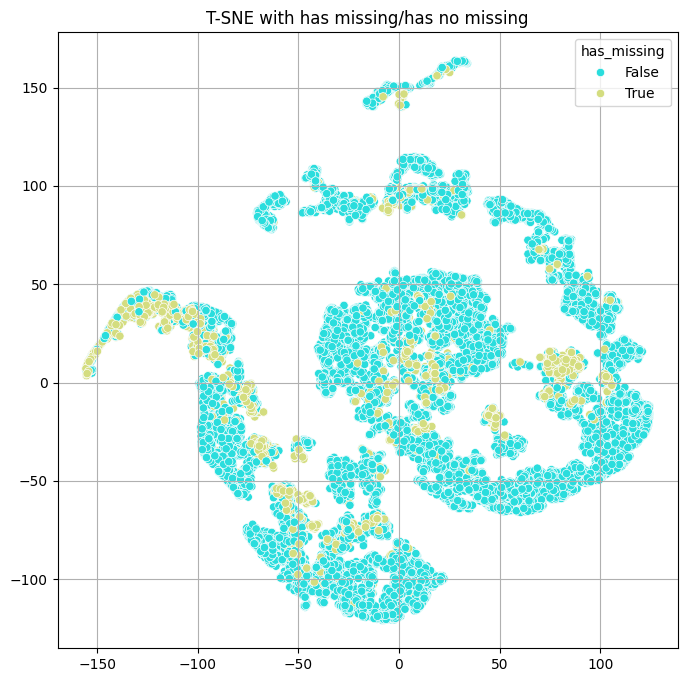

In [8]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["has_missing"], palette="rainbow")
plt.grid()
plt.title("T-SNE with has missing/has no missing")
plt.show()

<b>Clustering HDBSCAN</b>

0  
 11    8992
 8     3590
 2     1860
 3     1687
 9     1156
 5      989
 12     710
 6      610
 7      557
 0      555
-1      452
 10     436
 1      287
 4      284
Name: count, dtype: int64


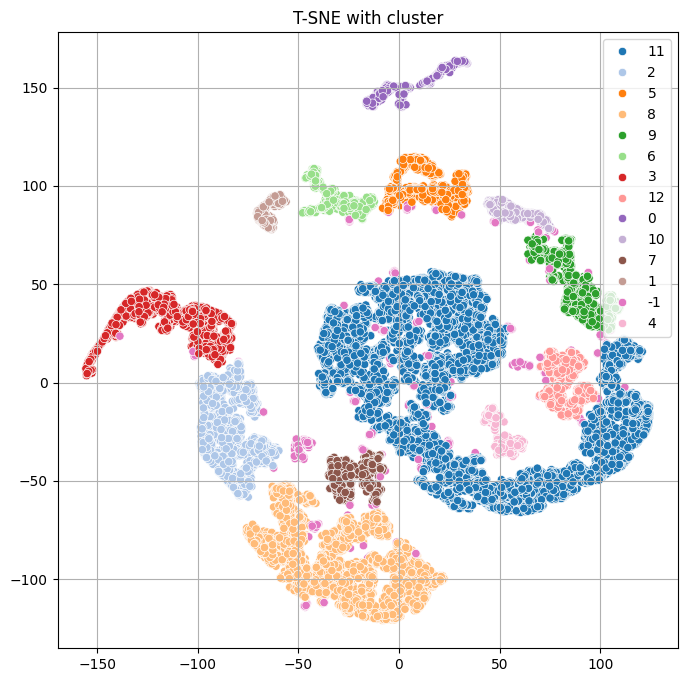

In [87]:
clusters = HDBSCAN(min_cluster_size=260, min_samples=30, metric="euclidean").fit_predict(X_emb)
df["cluster"] = clusters.astype(str)

print(pd.DataFrame(clusters).value_counts())

plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=clusters.astype(str), palette="tab20")
plt.grid()
plt.title("T-SNE with cluster")
plt.show()

In [83]:
df[["cluster", "Z_pred"]].groupby("cluster", sort=False).describe()

Z_pred                                                              \
           count      mean       std       min       25%       50%       75%   
cluster                                                                        
0        21689.0  1.797332  0.586174  0.070536  1.431104  1.841911  2.187344   
1          285.0  0.581411  0.091121  0.493413  0.547764  0.563776  0.579548   
-1         191.0  3.752147  0.543109  1.632870  3.603731  3.740134  3.972989   

                   
              max  
cluster            
0        3.519152  
1        1.409511  
-1       4.934409

In [76]:
df[["cluster", "Z_pred_std"]].groupby("cluster", sort=False).describe()

Z_pred_std                                                    \
             count      mean       std       min       25%       50%   
cluster                                                                
-1          4012.0  0.283534  0.160741  0.044719  0.144250  0.268451   
5           6727.0  0.218641  0.130322  0.050772  0.128265  0.178424   
6           6608.0  0.238531  0.124711  0.044040  0.146658  0.208168   
2           1446.0  0.206316  0.147527  0.051352  0.101482  0.136866   
4           2266.0  0.321417  0.164345  0.084535  0.207939  0.285262   
3            463.0  0.273050  0.158082  0.072413  0.166984  0.214043   
0            358.0  0.212705  0.180098  0.063646  0.115519  0.142745   
1            285.0  0.122804  0.098869  0.055537  0.071814  0.086734   

                             
              75%       max  
cluster                      
-1       0.388282  1.333876  
5        0.277144  0.989937  
6        0.304091  0.929057  
2        0.270965  1.002399  
4        0.391942  1.553125  
3        0.316921  0.817580  
0        0.210938  1.021892  
1        0.136689  0.838113

In [77]:
df[["cluster", "Z_spec_prob"]].groupby("cluster", sort=False).describe()

Z_spec_prob                                                        \
              count      mean       std           min       25%       50%   
cluster                                                                     
-1           4012.0  2.575613  3.200950  0.000000e+00  0.666014  1.443679   
5            6727.0  2.694027  2.268233  3.000000e-45  0.893357  2.277211   
6            6608.0  2.210344  1.743779  4.910000e-42  0.862472  1.899395   
2            1446.0  6.019200  5.376471  9.655051e-18  2.183440  4.933307   
4            2266.0  1.399970  0.997824  2.060368e-23  0.575842  1.277326   
3             463.0  5.739065  4.608420  9.659785e-05  1.465762  5.480507   
0             358.0  7.273354  4.706412  2.256685e-02  3.371780  6.995976   
1             285.0  6.741504  3.446740  9.079924e-08  4.108576  6.706976   

                               
               75%        max  
cluster                        
-1        3.051129  21.735909  
5         3.807025  15.442378  
6         3.186811  12.312057  
2         8.129821  30.461260  
4         2.047429   5.435872  
3         8.508750  20.501583  
0        10.850314  19.611120  
1         9.082955  18.943485

In [78]:
df[["cluster", "faint"]].groupby("cluster", sort=False).describe()

faint                    
        count unique    top  freq
cluster                          
-1       4012      2  False  2444
5        6727      2  False  4970
6        6608      2   True  3412
2        1446      2  False  1260
4        2266      2  False  1301
3         463      2  False   447
0         358      2  False   357
1         285      1  False   285

In [79]:
df[["cluster", "has_missing"]].groupby("cluster", sort=False).describe()

has_missing                    
              count unique    top  freq
cluster                                
-1             4012      2  False  3550
5              6727      2  False  6273
6              6608      2  False  5978
2              1446      2  False  1348
4              2266      2  False  1361
3               463      2  False   445
0               358      2  False   317
1               285      2  False   280

<b>Histogramy clustrów</b>

In [15]:
config_path = "configs/config.yml"
config = load_config(config_path)

filePath = "../KiDS-DR5-WCScut_x_DESI-DR1-small.fits"

dframe = DataFrame(filePath, "QSO", MaxFiller())
X_train, y_train = dframe.get_train_dataset()
features = dframe.features

scaler = StandardScaler()
scaler.fit(X_train)

modelPath = f"../models/experiment2/MG_{config["num_components"]}_components_3/variables/variables"
model = load_model(modelPath, models.MixtureGaussian, dframe, config)

Chi^2: 1423.703289147514


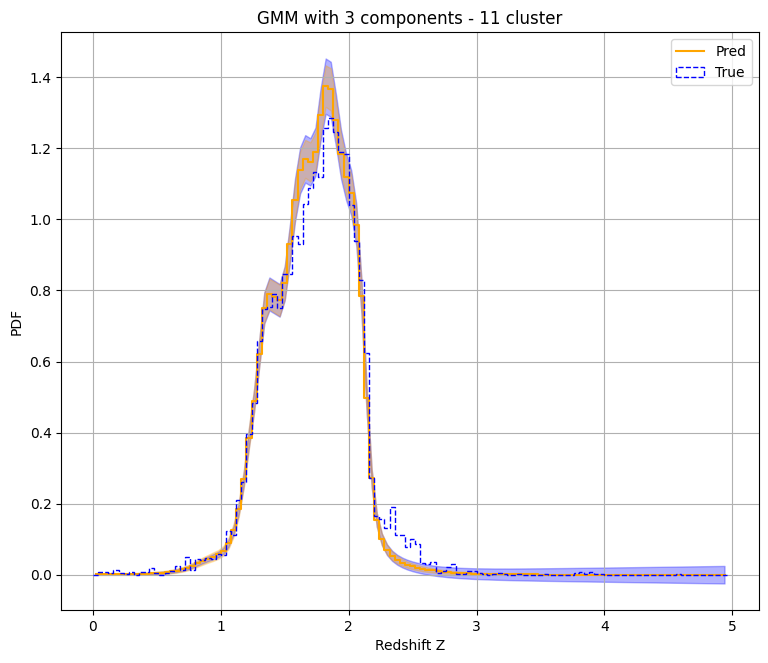

Chi^2: 1122.1593706006383


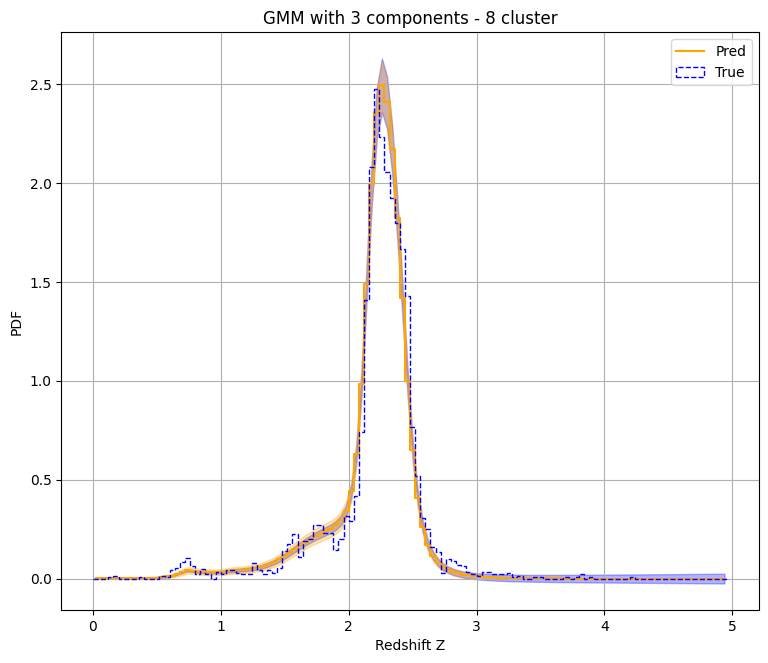

Chi^2: 1087.2637261600803


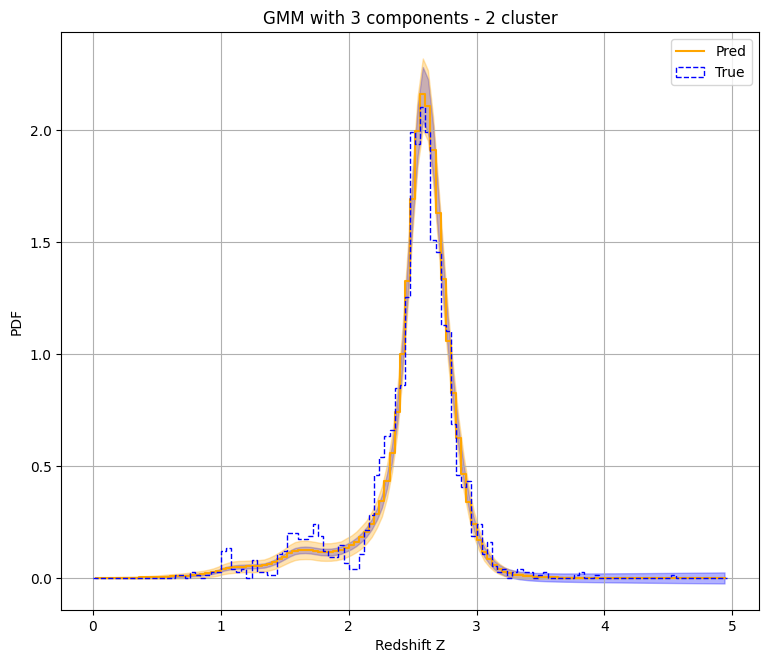

Chi^2: 2355.1478956261726


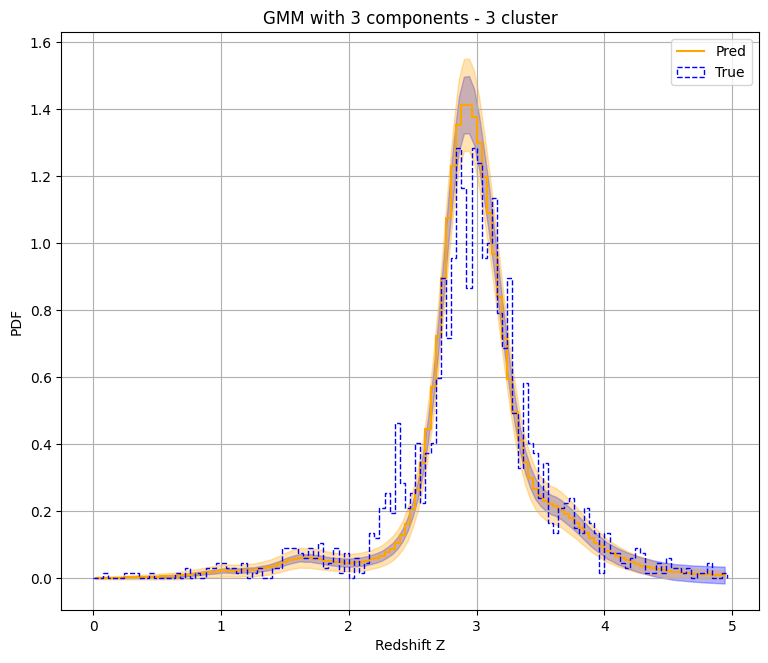

Chi^2: 4847.988486138751


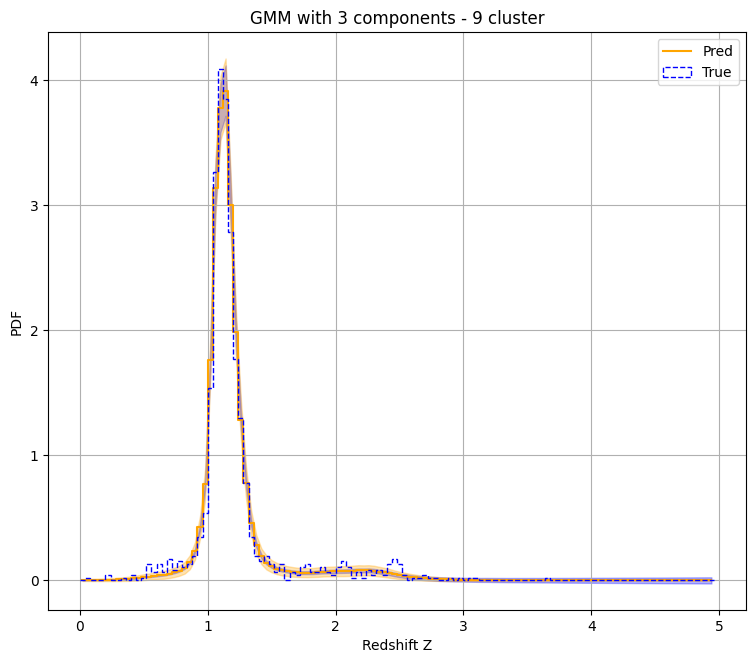

Chi^2: 5501.591537032876


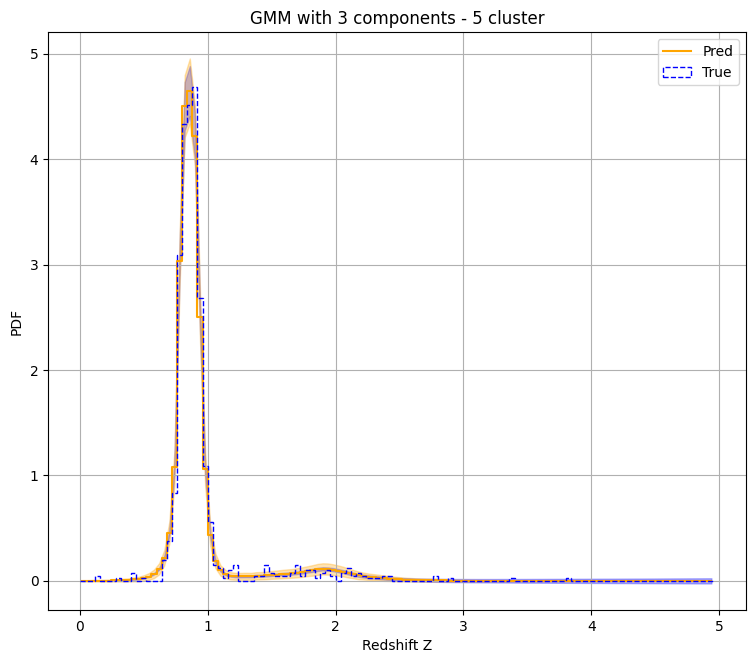

Chi^2: 6630.615452640694


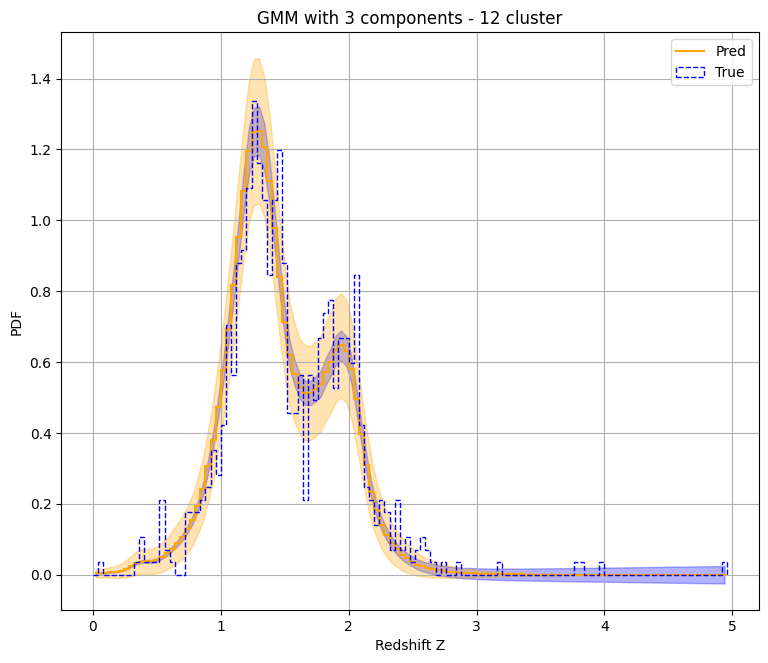

Chi^2: 3106.667885477711


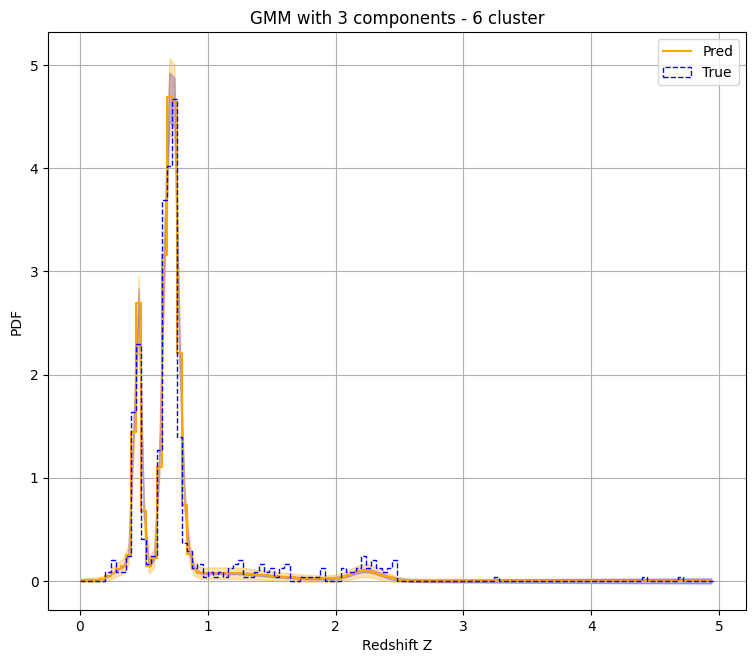

Chi^2: 30536.03583290158


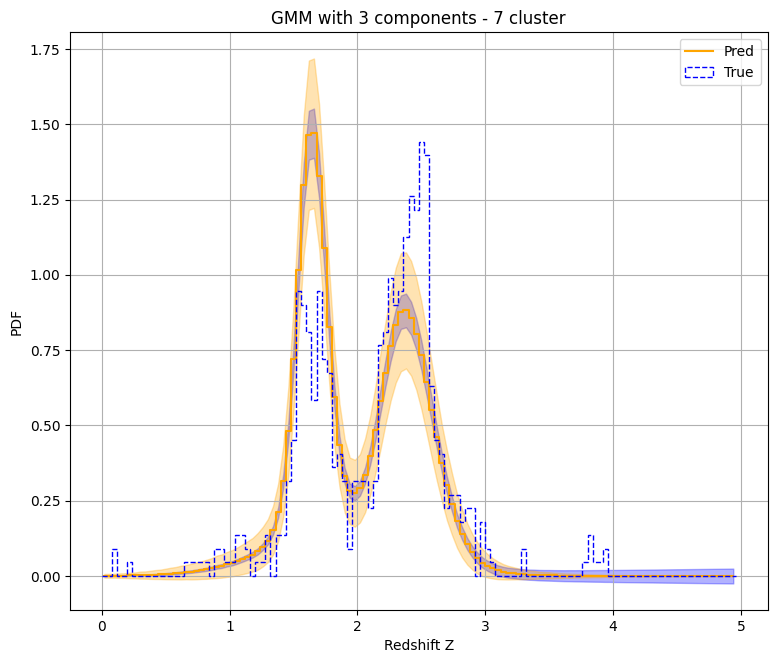

Chi^2: 1797.1591389275632


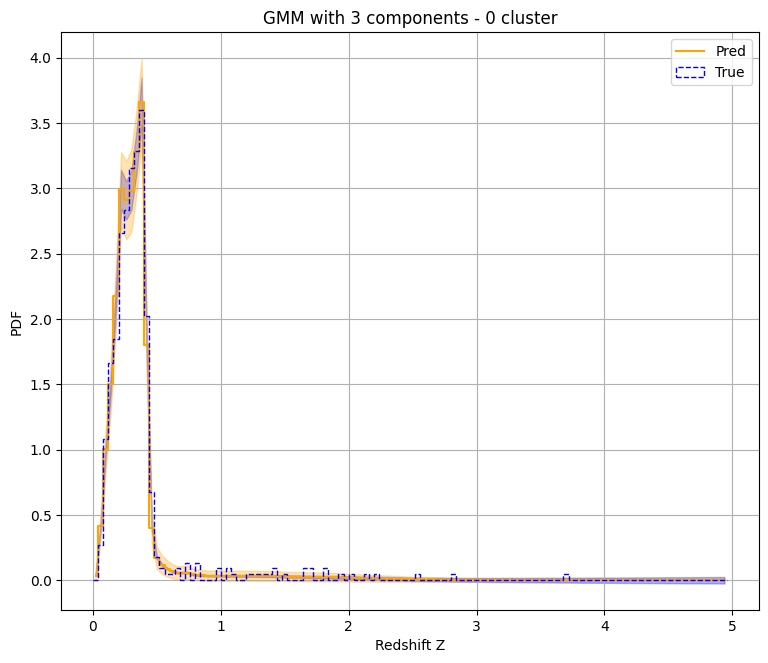

Chi^2: 6745.221229791363


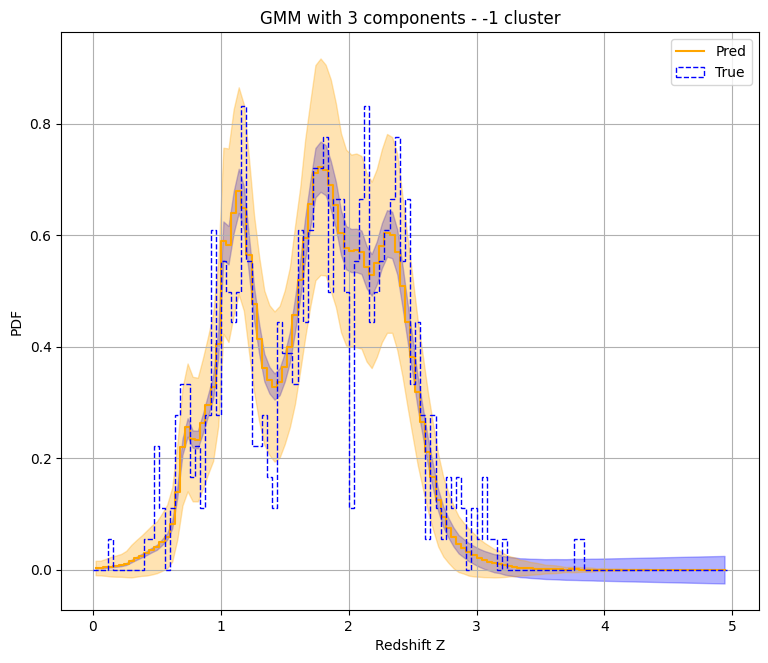

Chi^2: 3104.495154510522


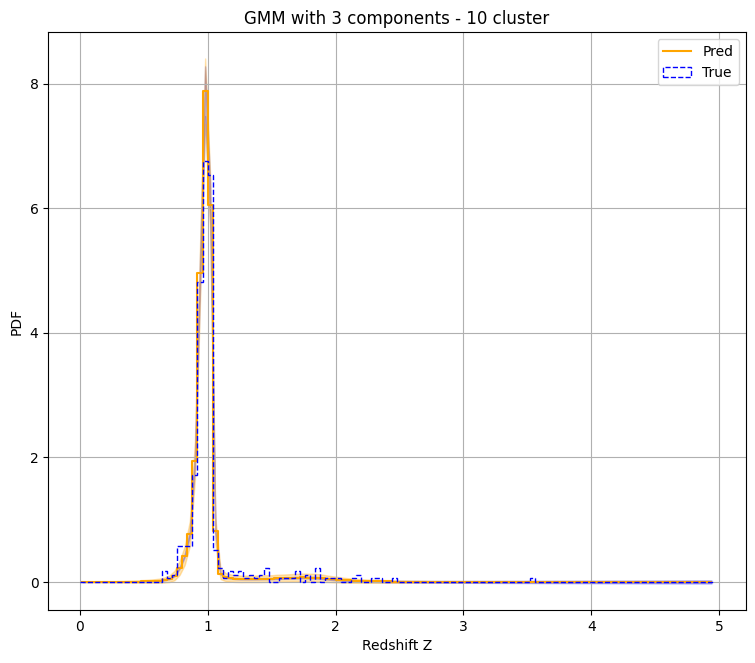

Chi^2: 7119.474334865347


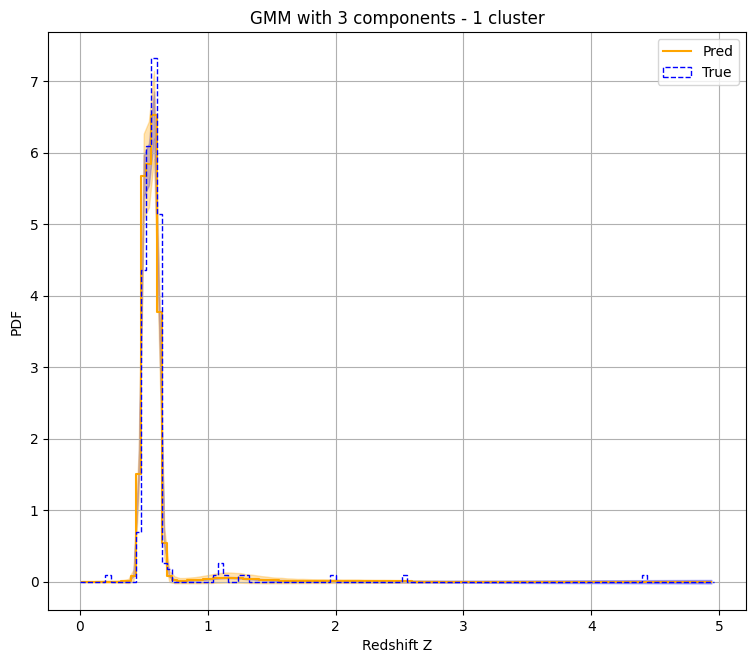

Chi^2: 4573.290408504439


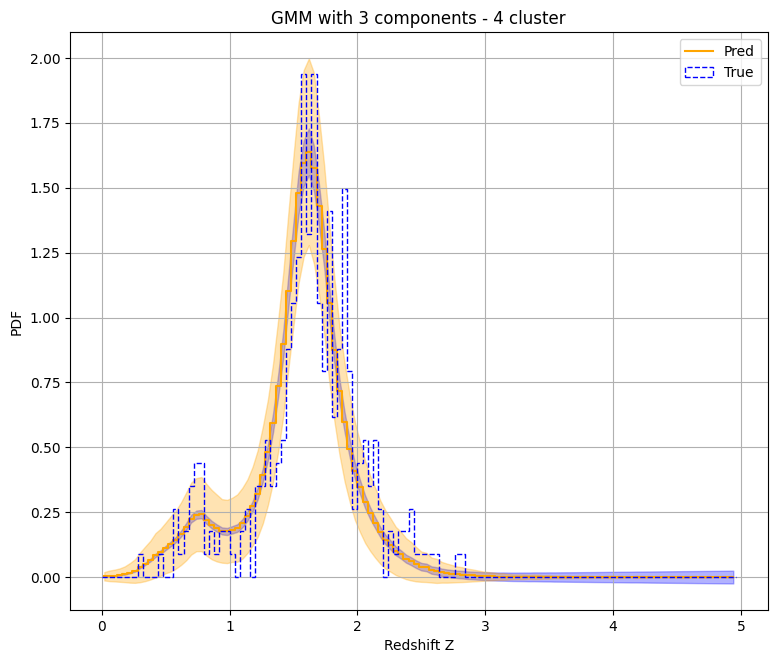

In [18]:
clusters = df["cluster"].value_counts().index.values

def return_cluster(df, cluster_num):
    df = df.loc[df["cluster"] == cluster_num]
    X, y = df.loc[:, features], df.loc[:, "Z"]
    X = scaler.transform(X)
    return X, y

for cluster in clusters:
    X, y = return_cluster(df, cluster)
    histPlotter = HistPlotter(X, y, f"{cluster}", model, "GMM")
    histPlotter.evaluate_model()

<b>Wykres korelacji z clustrami</b>

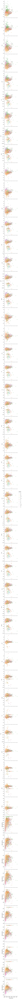

In [17]:
sns.pairplot(df.sample(int(df.shape[0] * 0.1)), x_vars=["Z_pred_std"], y_vars=COLORS + MAGNITUDES, kind="scatter", hue="cluster", palette="tab20", height=3.5, plot_kws=dict(s=30, alpha=0.5))